In [121]:
import pandas as pd

medical_df = pd.read_csv("./data_sets/insurance.csv")

medical_df.head(30)

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
6,46,female,33.440,1,no,southeast,8240.58960
7,37,female,27.740,3,no,northwest,7281.50560
8,37,male,29.830,2,no,northeast,6406.41070
9,60,female,25.840,0,no,northwest,28923.13692


In [122]:
medical_df.shape

(1338, 7)

In [123]:
medical_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [124]:
medical_df.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


In [125]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [126]:
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.facecolor'] = '#00000000'

In [127]:
medical_df.age.describe()

count    1338.000000
mean       39.207025
std        14.049960
min        18.000000
25%        27.000000
50%        39.000000
75%        51.000000
max        64.000000
Name: age, dtype: float64

In [128]:
fig = px.histogram(
    medical_df,
    x = 'age',
    marginal = 'box',
    nbins = 47,
    title = 'Age Distribution',
)

fig.update_layout(bargap = 0.1)
fig.show()

<p>The distribution of ages in the dataset is almost uniform, with 20-30 customers at every age except for the ages 18 and 19 which seem to have over twice as many customers as other ages. The uniform distribution might arise from the fact that there isn't a big variation in the number of people of any given age in the USA</p>

In [129]:
fig = px.histogram(
    medical_df,
    x = 'bmi',
    marginal = 'box',
    color_discrete_sequence = ['red'],
    title = 'Distribution of the BMI (Body Mass Index)'
)

fig.update_layout(bargap = 0.1)
fig.show()

<p>The measurements of the Body Mass Index seem to form a Gaussian distribution centered around the value of 30, with a few outliers towards the right</p>

<h5>The distribution of medical charges</h5>

In [130]:
fig = px.histogram(
    medical_df,
    x = 'charges',
    marginal = 'box',
    color = 'smoker',
    color_discrete_sequence = ['green', 'gray'],
    title = 'Annual Medical Charges'
)

fig.update_layout(bargap = 0.1)
fig.show()

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<p>For most customers, the annual medical charges are under $10,000. Only a small fraction of customers have higher medical expenses, possibly due to accidents, major illnesses and genetic diseases. The distribution follows the power law. There is a significant difference in medical expenses between smokers and non-smokers. While the median for non-smokers is $7300, the median for smokers is close to $35,000</p>

In [131]:
fig = px.histogram(
    medical_df,
    x = 'charges',
    marginal = 'box',
    color = 'sex',
    color_discrete_sequence = ['green', 'gray'],
    title = 'Annual Medical Charges'
)

fig.update_layout(bargap = 0.1)
fig.show()

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<p>The data in the graph above implies no significant correlation between sex and medical expenses</p>

In [132]:
fig = px.histogram(
    medical_df,
    x = 'charges',
    marginal = 'box',
    color = 'region',
    color_discrete_sequence = ['green', 'gray', 'blue', 'red'],
    title = 'Annual Medical Charges'
)

fig.update_layout(bargap = 0.1)
fig.show()

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<p>The graph shows no significant correlation between region and medical expenses</p>

In [133]:
medical_df.smoker.value_counts()

smoker
no     1064
yes     274
Name: count, dtype: int64

In [134]:
px.histogram(medical_df, x='smoker', color='sex', title='Smoker')

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<h5>Visualization of the relationship between 'age' and 'charges' using a scatter plot. Each point in the scatter plot represents one customer. We'll use the values in the 'smoker' column to color the points</h5>

In [135]:
fig = px.scatter(
    medical_df,
    x = 'age',
    y = 'charges',
    color = 'smoker',
    opacity = 0.8,
    hover_data = ['sex'],
    title = 'Age vs Charges'
)

fig.update_traces(marker_size = 5)
fig.show()

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<p>The data seems to show medical charges increasing with age. However, there is a significant variation at every age, and it is clear that age alone cannot be used to accurately determine medical charges.There are three clusters of data, each of which seem to form a line with an increasing slope. <ul><li>The first and largest cluster consists primarily of presumably 'healthy non smokers' who have relatively low medical charges compared to others</li><li>The second cluster contains a mix of smokers and non-smokers. It is possible that thee are actually two distinct but overlapping clusters. 'Non smokers with medical issues' and 'smokers who don t have major medical issues'</li><li>The final cluster consists exclusively of smokers, presumably smokers with some major medical issued that are possibly related to or worsened by smoking</li></ul></p>

<h5>BMI and Medical Charges</h5>

In [136]:
fig = px.scatter(
    medical_df, 
    x = 'bmi',
    y = 'charges',
    color = 'smoker',
    opacity = 0.8,
    hover_data = ['sex'],
    title = 'BMI vs Charges'
)

fig.update_traces(marker_size = 5)
fig.show()

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<p>It appears that for non-smokers, an increase in BMI doesn't seem to be related to an increase in medical charges. However, medical charges seem to be significantly higher for smokers with a BMI greater than 30</p>

In [137]:
fx = px.scatter(
    medical_df,
    x = 'children',
    y = 'charges',
    color = 'smoker',
        hover_data = ['age'],
    title = 'Charges vs Children'
)

fx.update_traces(marker_size = 5)
fig.show()

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [138]:
medical_df.charges.corr(medical_df.age)

0.2990081933306478

In [139]:
medical_df.charges.corr(medical_df.bmi)

0.19834096883362887

In [140]:
medical_df.charges.corr(medical_df.children)

0.06799822684790487

In [141]:
smoker_values = {'no': 0, 'yes': 1}
smoker_numeric = medical_df.smoker.map(smoker_values)
smoker_numeric.head()

0    1
1    0
2    0
3    0
4    0
Name: smoker, dtype: int64

In [142]:
medical_df.charges.corr(smoker_numeric)

0.7872514304984778

In [143]:
sex_values = {'male': 0, 'female': 1}
sex_numeric = medical_df.sex.map(sex_values)
sex_numeric.head()

0    1
1    0
2    0
3    0
4    0
Name: sex, dtype: int64

In [144]:
medical_df.charges.corr(sex_numeric)

-0.05729206220202533

<h4>Linear Regression Using a Single Feature</h4>

In [145]:
non_smoker_df = medical_df[medical_df.smoker == 'no']
non_smoker_df.head(30)

,age,sex,bmi,children,smoker,region,charges
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
6,46,female,33.440,1,no,southeast,8240.58960
7,37,female,27.740,3,no,northwest,7281.50560
8,37,male,29.830,2,no,northeast,6406.41070
9,60,female,25.840,0,no,northwest,28923.13692
10,25,male,26.220,0,no,northeast,2721.32080


<Axes: title={'center': 'Age vs Charges'}, xlabel='age', ylabel='charges'>

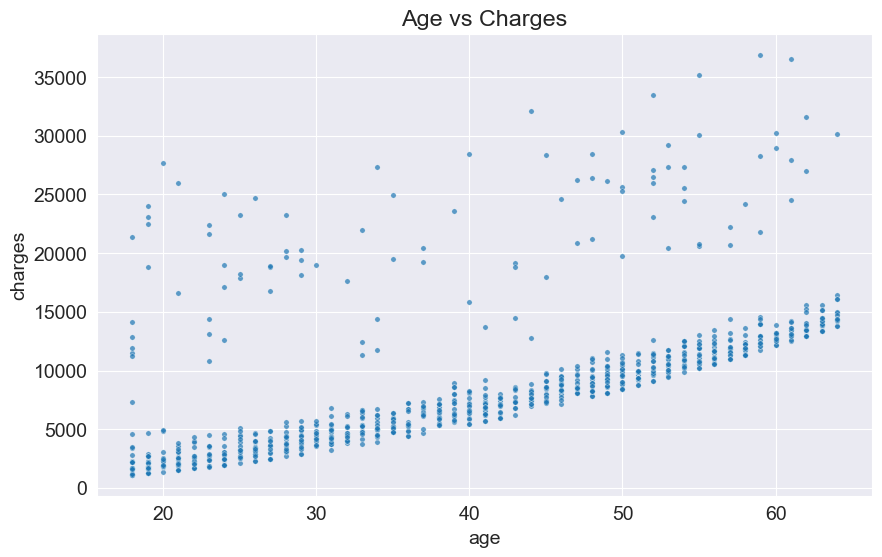

In [146]:
plt.title('Age vs Charges')
sns.scatterplot(data=non_smoker_df, x='age', y='charges', alpha = 0.7, s = 15)

In [147]:
def estimate_charges(age, w, b):
    return w * age + b

In [148]:
w = 50
b = 100

In [149]:
estimate_charges(40, w, b)

2100

In [150]:
ages = non_smoker_df.age
ages

1       18
2       28
3       33
4       32
5       31
        ..
1332    52
1333    50
1334    18
1335    18
1336    21
Name: age, Length: 1064, dtype: int64

In [151]:
estimate_charges_value = estimate_charges(ages, w, b)
estimate_charges_value

1       1000
2       1500
3       1750
4       1700
5       1650
        ... 
1332    2700
1333    2600
1334    1000
1335    1000
1336    1150
Name: age, Length: 1064, dtype: int64

In [152]:
non_smoker_df.charges

1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
5        3756.62160
           ...     
1332    11411.68500
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
Name: charges, Length: 1064, dtype: float64

Text(0, 0.5, 'Estimated Charges')

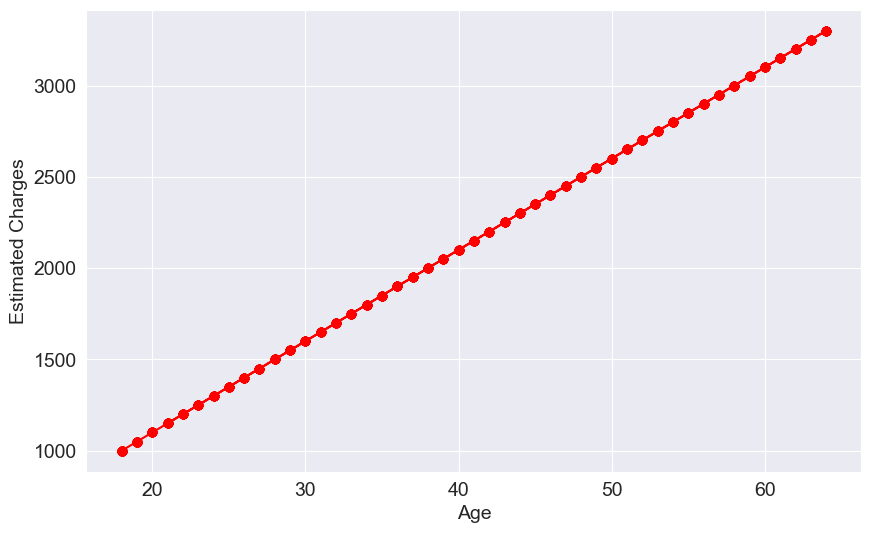

In [153]:
plt.plot(ages, estimate_charges_value, 'r-o')
plt.xlabel('Age')
plt.ylabel('Estimated Charges')

Text(0, 0.5, 'Estimated Charges')

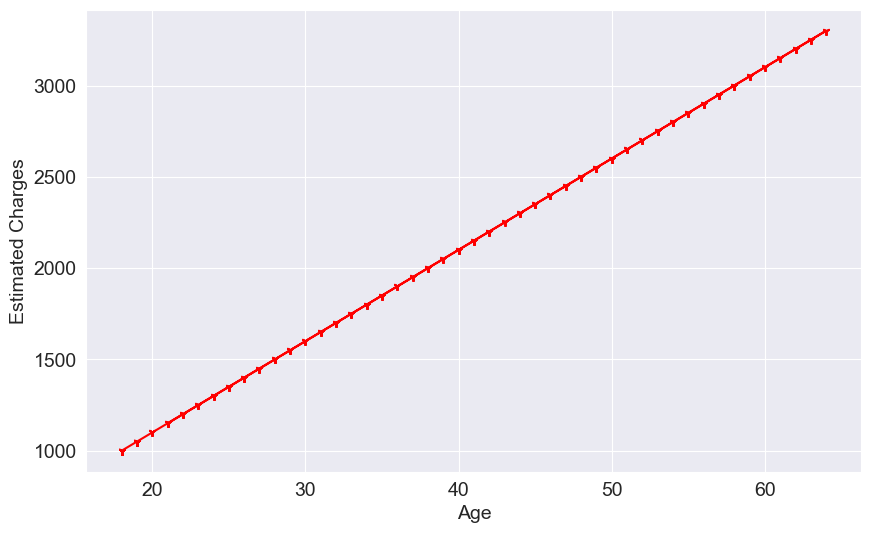

In [154]:
plt.plot(ages, estimate_charges_value, 'r-1')
plt.xlabel('Age')
plt.ylabel('Estimated Charges')

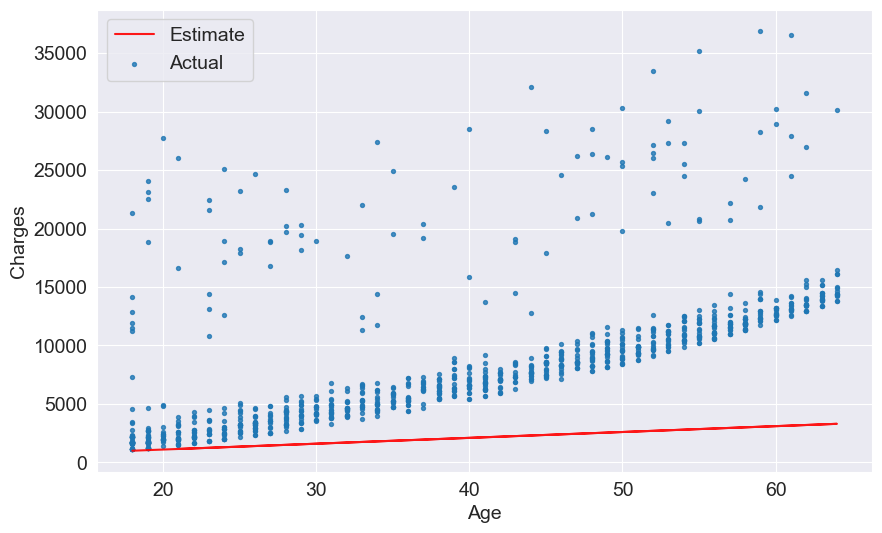

In [155]:
target = non_smoker_df.charges

plt.plot(ages, estimate_charges_value, 'r', alpha = 0.9)

plt.scatter(ages, target, s=8, alpha = 0.8)
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend(['Estimate', 'Actual'])

In [156]:
def try_parameters(w, b):
    ages = non_smoker_df.age
    target = non_smoker_df.charges
    
    estimate_charges_value = estimate_charges(ages, w, b)

    plt.plot(ages, estimate_charges_value, 'r', alpha = 0.9)
    plt.scatter(ages, target, s=8, alpha=0.9)
    plt.xlabel('Age')
    plt.ylabel('Charges')
    plt.legend(['Estimate', 'Actual'])

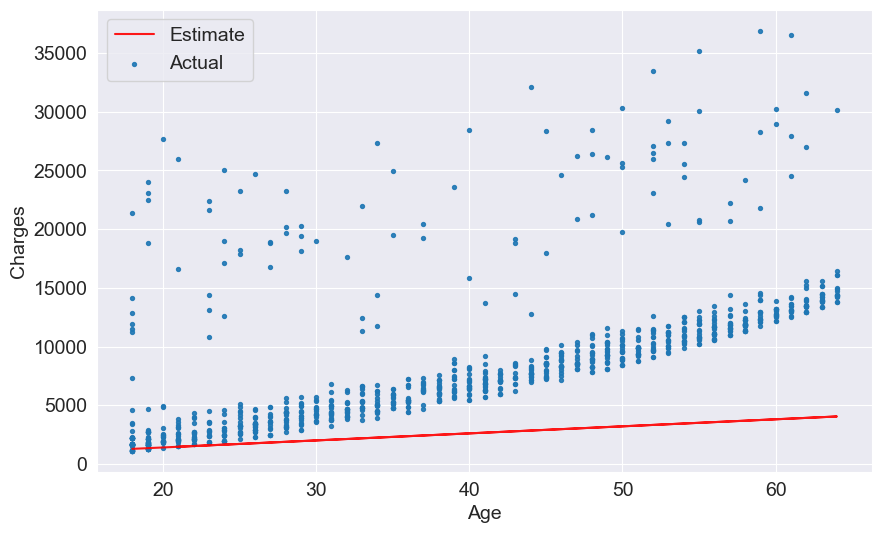

In [157]:
try_parameters(60, 200)

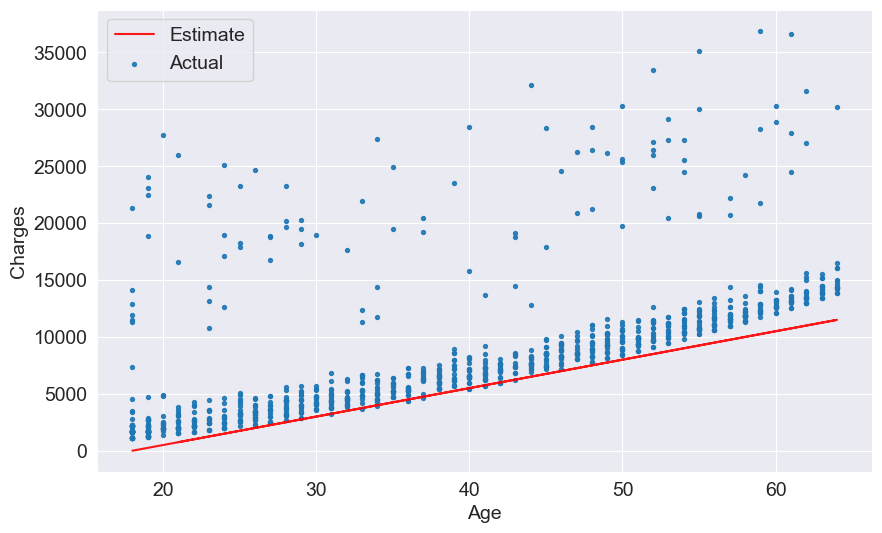

In [158]:
try_parameters(250, -4500)

In [159]:
targets = non_smoker_df.charges
targets

1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
5        3756.62160
           ...     
1332    11411.68500
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
Name: charges, Length: 1064, dtype: float64

In [160]:
predictions = estimate_charges_value
predictions

1       1000
2       1500
3       1750
4       1700
5       1650
        ... 
1332    2700
1333    2600
1334    1000
1335    1000
1336    1150
Name: age, Length: 1064, dtype: int64

In [161]:
import numpy as np

def rmse(targets, predictions):
    return np.sqrt(np.mean(np.square(targets - predictions)))

In [162]:
w = 50
b = 100

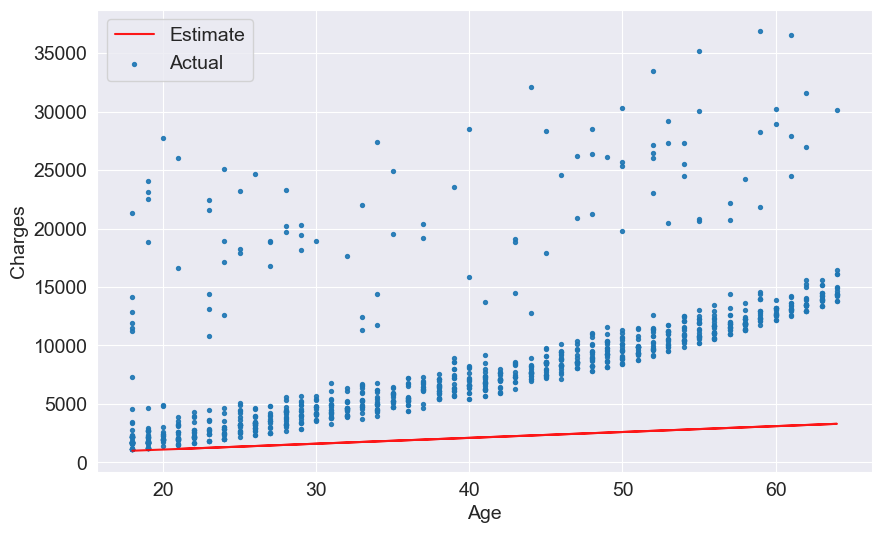

In [163]:
try_parameters(w, b)

In [164]:
targets = non_smoker_df.charges
predicted = estimate_charges(non_smoker_df.age, w, b)

In [165]:
rmse(targets, predicted)

8461.949562575493

<p>On average, each element in the prediction differs from the actual target by $8461. This value is also called a loss because it indicated just how bad the model is at prediction</p>

In [166]:
def try_parameters(w, b):
    ages = non_smoker_df.age
    target = non_smoker_df.charges
    predictions = estimate_charges(ages, w, b)

    plt.plot(ages, predictions, 'r', alpha = 0.9)
    plt.scatter(ages, target, s=8, alpha=0.8)
    plt.xlabel('Age')
    plt.ylabel('Charges')
    plt.legend(['Predictions', 'Actual'])
    
    loss = rmse(target, predictions)
    print('RMSE Loss: ', loss)

RMSE Loss:  4956.973980899423


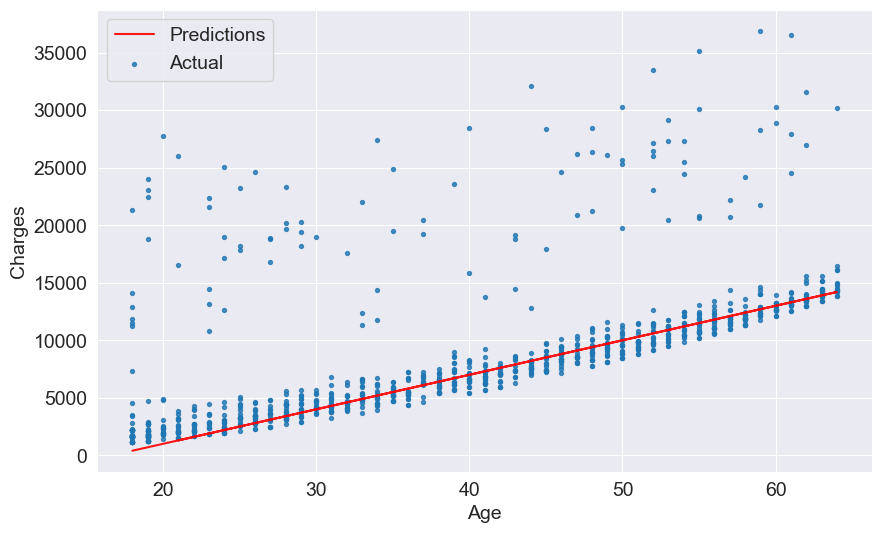

In [167]:
try_parameters(300, -5000)

<h4>Linear Regression using Scikit Learn</h4>

In [168]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [169]:
help(model.fit)

Help on method fit in module sklearn.linear_model._base:

fit(X, y, sample_weight=None) method of sklearn.linear_model._base.LinearRegression instance
    Fit linear model.

    Parameters
    ----------
    X : {array-like, sparse matrix} of shape (n_samples, n_features)
        Training data.

    y : array-like of shape (n_samples,) or (n_samples, n_targets)
        Target values. Will be cast to X's dtype if necessary.

    sample_weight : array-like of shape (n_samples,), default=None
        Individual weights for each sample.

        .. versionadded:: 0.17
           parameter *sample_weight* support to LinearRegression.

    Returns
    -------
    self : object
        Fitted Estimator.



In [170]:
inputs = non_smoker_df[['age']]
targets = non_smoker_df.charges

print('inputs.shape: ', inputs.shape)
print('targets.shape: ', targets.shape)

inputs.shape:  (1064, 1)
targets.shape:  (1064,)


In [171]:
model.fit(inputs, targets)

LinearRegression()

<p>Making predictions using the model</p>

In [172]:
model.predict(np.array([[23], [37], [61]]))

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



array([ 4055.30443855,  7796.78921819, 14210.76312614])

In [173]:
predictions = model.predict(inputs)
predictions

array([2719.0598744 , 5391.54900271, 6727.79356686, ..., 2719.0598744 ,
       2719.0598744 , 3520.80661289])

In [174]:
inputs

,age
1,18
2,28
3,33
4,32
5,31
...,...
1332,52
1333,50
1334,18
1335,18


In [175]:
targets

1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
5        3756.62160
           ...     
1332    11411.68500
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
Name: charges, Length: 1064, dtype: float64

In [176]:
rmse(targets, predictions)

4662.505766636395

In [177]:
model.coef_

array([267.24891283])

In [178]:
model.intercept_

-2091.4205565650864

RMSE Loss:  4662.505766636395


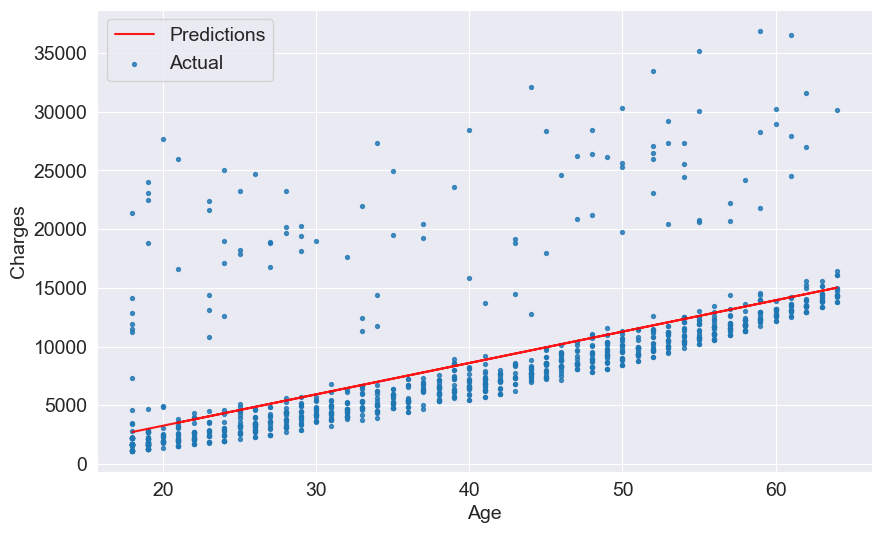

In [179]:
try_parameters(model.coef_, model.intercept_)

In [180]:
from sklearn.linear_model import SGDRegressor
model_2 = SGDRegressor()

In [181]:
model_2.fit(inputs, targets)

SGDRegressor()

In [182]:
model_2.predict(np.array([[23], [37], [61]]))

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but SGDRegressor was fitted with feature names



array([ 7304.04176626,  9936.64344324, 14449.6748895 ])

In [183]:
predictions_2 = model_2.predict(inputs)
predictions_2

array([6363.82688162, 8244.2566509 , 9184.47153553, ..., 6363.82688162,
       6363.82688162, 6927.95581241])

In [184]:
rmse(targets, predictions_2)

5175.731982698412

In [185]:
model_2.coef_

array([188.04297693])

In [186]:
model_2.intercept_

array([2979.05329693])

RMSE Loss:  5175.731982698412


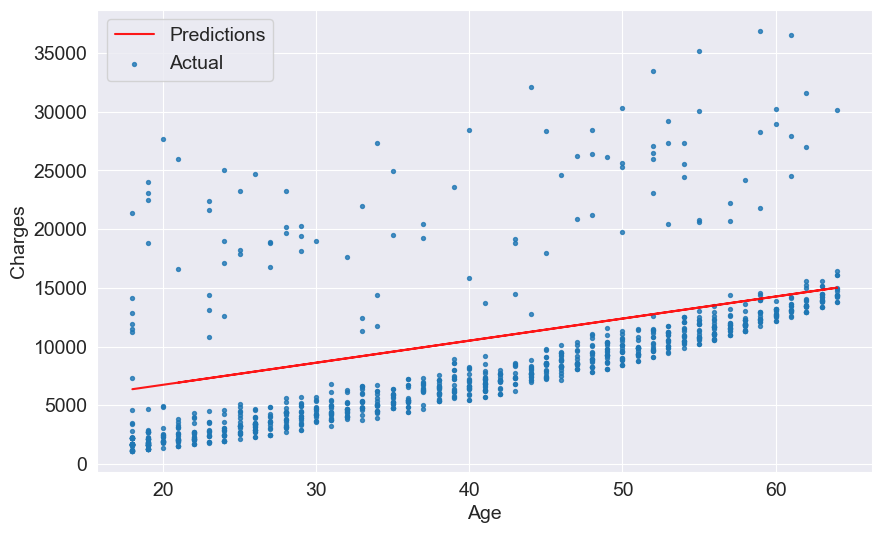

In [187]:
try_parameters(model_2.coef_, model_2.intercept_)

<h5>Linear Regression using smoker data</h5>

In [188]:
smoker_df = medical_df[medical_df.smoker == 'yes']
smoker_df

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
11,62,female,26.290,0,yes,southeast,27808.72510
14,27,male,42.130,0,yes,southeast,39611.75770
19,30,male,35.300,0,yes,southwest,36837.46700
23,34,female,31.920,1,yes,northeast,37701.87680
...,...,...,...,...,...,...,...
1313,19,female,34.700,2,yes,southwest,36397.57600
1314,30,female,23.655,3,yes,northwest,18765.87545
1321,62,male,26.695,0,yes,northeast,28101.33305
1323,42,female,40.370,2,yes,southeast,43896.37630


In [189]:
smoker_inputs = smoker_df[['age']]
smoker_targets = smoker_df.charges

In [190]:
model.fit(smoker_inputs, smoker_targets)

LinearRegression()

In [191]:
from sklearn.linear_model import LinearRegression

smoker_model = LinearRegression()

In [192]:
smoker_model.fit(smoker_inputs, smoker_targets)

LinearRegression()

In [193]:
smoker_model.predict(np.array([[23], [37], [61]]))

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



array([27314.59297544, 31587.91940498, 38913.62185562])

In [194]:
rmse(smoker_targets, smoker_inputs)

nan

In [195]:
smoker_model.coef_

array([305.23760211])

In [196]:
smoker_model.intercept_

20294.12812691597

RMSE Loss:  24338.502872599212


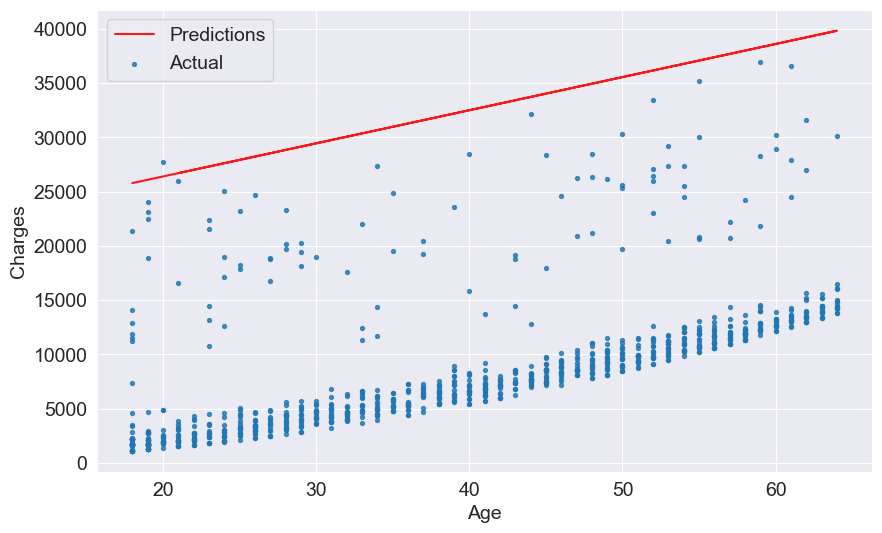

In [197]:
try_parameters(smoker_model.coef_, smoker_model.intercept_)

In [198]:
from sklearn.linear_model import SGDRegressor

smoker_model_2 = SGDRegressor()

In [199]:
smoker_model_2.fit(smoker_inputs, smoker_targets)

SGDRegressor()

In [200]:
smoker_model_2.predict(np.array([[23], [37], [61]]))

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but SGDRegressor was fitted with feature names



array([ 5.79741710e+08, -1.81706349e+09, -5.92587240e+09])

<h4>Linear Regression using Multiple Features</h4>

In [201]:
# Create inputs and targets
from sklearn.linear_model import LinearRegression
inputs, targets = non_smoker_df[['age', 'bmi']], non_smoker_df['charges']

# Create and train the model
model = LinearRegression().fit(inputs, targets)

# Create Predictions
predictions = model.predict(inputs)

# Compute loss to evaluate the model
loss = rmse(targets, predictions)
print('Loss:', loss)

Loss: 4662.3128354612945


In [202]:
non_smoker_df.charges.corr(non_smoker_df.bmi)

0.08403654312833271

In [203]:
fig = px.scatter(non_smoker_df, x = 'bmi', y = 'charges', title = 'BMI vs Charges')
fig.update_traces(marker_size = 5)
fig.show()

In [204]:
model.coef_, model.intercept_

(array([266.87657817,   7.07547666]), -2293.6320906488727)

In [205]:
non_smoker_df.charges.corr(non_smoker_df.children)

0.13892870453542205

In [206]:
fig = px.strip(non_smoker_df, x='children', y='charges', title = 'Children Vs Charges')
fig.update_traces(marker_size=4, marker_opacity = 0.7)
fig.show()

In [207]:
# Create inputs and targets
from sklearn.linear_model import LinearRegression
inputs, targets = non_smoker_df[['age', 'bmi', 'children']], non_smoker_df['charges']

# Create and train the model
model = LinearRegression().fit(inputs, targets)

# Generate Predictions
model.predict(inputs)

# Compute loss to evaluate the model
loss = rmse(targets, predictions)
print('Loss:', loss)

Loss: 4662.3128354612945


In [208]:
from sklearn.linear_model import LinearRegression
inputs, targets = medical_df[['age', 'bmi', 'children']], medical_df['charges']

model = LinearRegression().fit(inputs, targets)

predictions = model.predict(inputs)

loss = rmse(predictions, targets)
print('Loss: ', loss)

Loss:  11355.317901125973


In [209]:
px.scatter(medical_df, x='age', y='charges', color='smoker')

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



<h4>Using Categorical Features For Machine Learning</h4>

<h5>Binary Categories</h5>

<p>The smoker category has two unique values. The following code will convert the False to 0 and True to 1</p>

,age,sex,bmi,children,smoker,region,charges,smoker_code
0,19,female,27.900,0,yes,southwest,16884.92400,1
1,18,male,33.770,1,no,southeast,1725.55230,0
2,28,male,33.000,3,no,southeast,4449.46200,0
3,33,male,22.705,0,no,northwest,21984.47061,0
4,32,male,28.880,0,no,northwest,3866.85520,0
...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0
1334,18,female,31.920,0,no,northeast,2205.98080,0
1335,18,female,36.850,0,no,southeast,1629.83350,0
1336,21,female,25.800,0,no,southwest,2007.94500,0


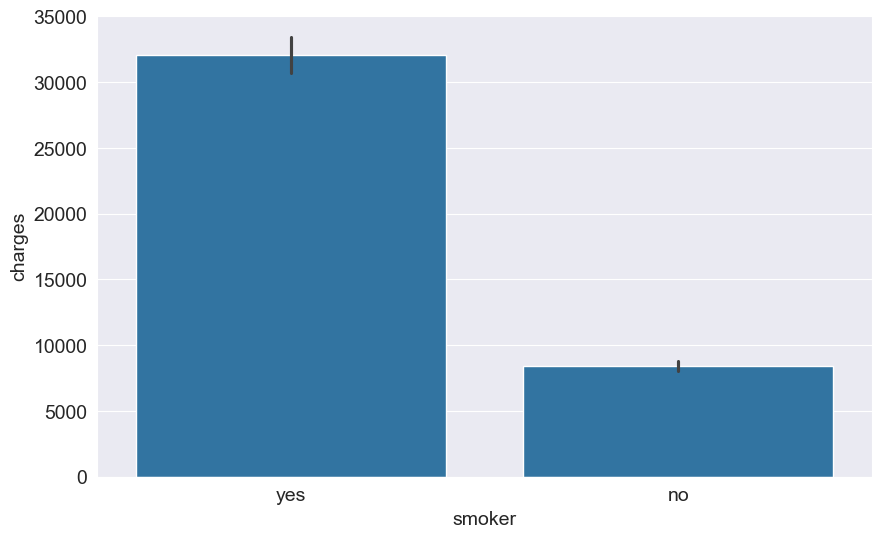

In [210]:
import seaborn as sns

sns.barplot(data=medical_df, x='smoker', y='charges')
smoker_codes = {'no': 0, 'yes': 1}
medical_df['smoker_code'] = medical_df['smoker'].map(smoker_codes)
medical_df.charges.corr(medical_df.smoker_code)
medical_df

In [211]:
from sklearn.linear_model import LinearRegression
inputs, targets = medical_df[['age', 'bmi', 'children', 'smoker_code']], medical_df['charges']

model = LinearRegression().fit(inputs, targets)

predictions = model.predict(inputs)

loss = rmse(targets, predictions)
loss

6056.439217188081

<Axes: xlabel='sex', ylabel='charges'>

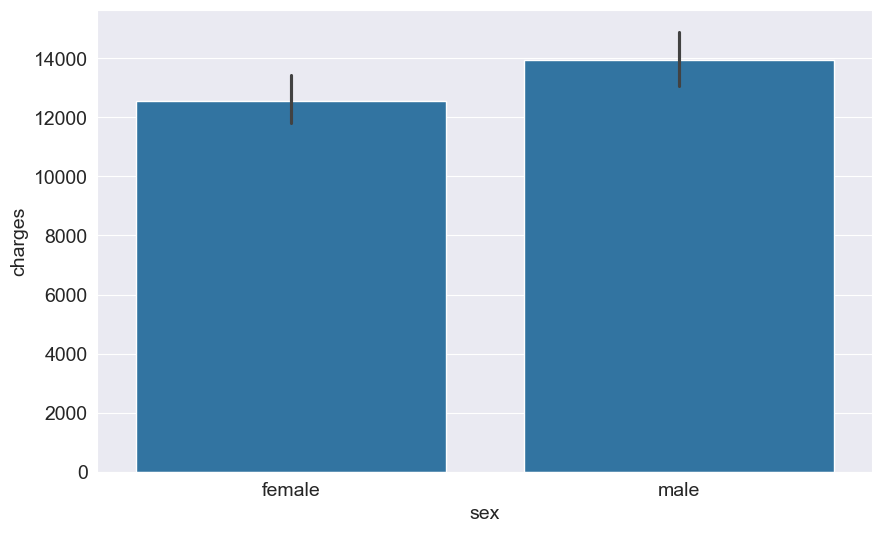

In [212]:
sns.barplot(data=medical_df, x='sex', y='charges')

In [213]:
sex_codes = {'female': 0, 'male': 1}
medical_df['sex_code'] = medical_df.sex.map(sex_codes)
medical_df

,age,sex,bmi,children,smoker,region,charges,smoker_code,sex_code
0,19,female,27.900,0,yes,southwest,16884.92400,1,0
1,18,male,33.770,1,no,southeast,1725.55230,0,1
2,28,male,33.000,3,no,southeast,4449.46200,0,1
3,33,male,22.705,0,no,northwest,21984.47061,0,1
4,32,male,28.880,0,no,northwest,3866.85520,0,1
...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0,1
1334,18,female,31.920,0,no,northeast,2205.98080,0,0
1335,18,female,36.850,0,no,southeast,1629.83350,0,0
1336,21,female,25.800,0,no,southwest,2007.94500,0,0


In [214]:
medical_df.charges.corr(medical_df.sex_code)

0.05729206220202533

In [215]:
from sklearn.linear_model import LinearRegression
inputs, targets = medical_df[['age', 'bmi', 'children', 'smoker_code', 'sex_code']], medical_df['charges']

model = LinearRegression().fit(inputs, targets)

prediction = model.predict(inputs)

loss = rmse(targets, prediction)
loss

6056.100708754546

<h5>One Hot Encoding for the Region values</h5>

<Axes: xlabel='region', ylabel='charges'>

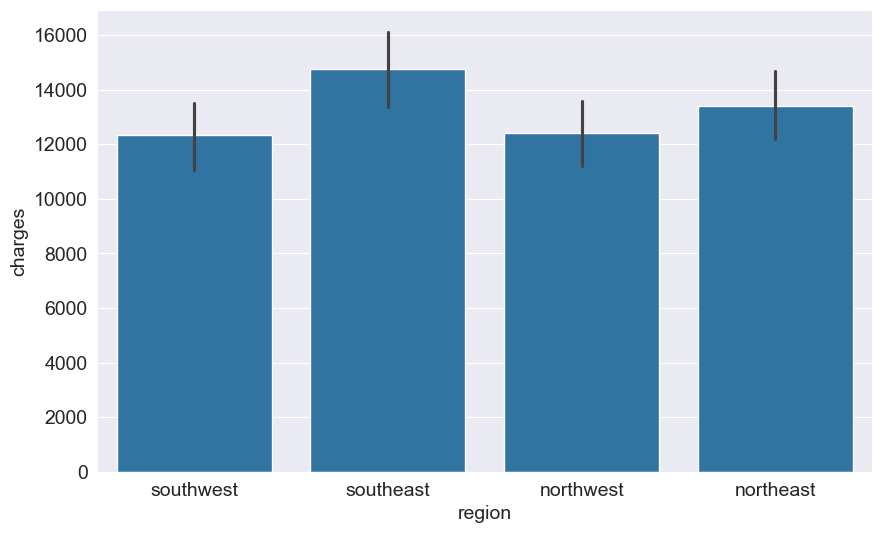

In [216]:
sns.barplot(data=medical_df, x='region', y='charges')

In [217]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder()
enc.fit(medical_df[['region']])
enc.categories_

[array(['northeast', 'northwest', 'southeast', 'southwest'], dtype=object)]

In [218]:
one_hot = enc.transform(medical_df[['region']]).toarray()
one_hot

array([[0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.]])

In [219]:
medical_df[['northeast', 'northwest', 'southeast', 'southwest']] = one_hot
medical_df.head()

,age,sex,bmi,children,smoker,region,charges,smoker_code,sex_code,northeast,northwest,southeast,southwest
0,19,female,27.900,0,yes,southwest,16884.92400,1,0,0.0,0.0,0.0,1.0
1,18,male,33.770,1,no,southeast,1725.55230,0,1,0.0,0.0,1.0,0.0
2,28,male,33.000,3,no,southeast,4449.46200,0,1,0.0,0.0,1.0,0.0
3,33,male,22.705,0,no,northwest,21984.47061,0,1,0.0,1.0,0.0,0.0
4,32,male,28.880,0,no,northwest,3866.85520,0,1,0.0,1.0,0.0,0.0


In [220]:
input_cols = ['age', 'bmi', 'children', 'smoker_code', 'sex_code', 'northeast', 'northwest', 'southeast', 'southwest']
inputs, targets = medical_df[input_cols], medical_df['charges']

model = LinearRegression().fit(inputs, targets)

predictions = model.predict(inputs)

loss = rmse(targets, predictions)
print('Loss:', loss)

Loss: 6041.6796511744515


In [221]:
model.coef_, model.intercept_

(array([  256.85635254,   339.19345361,   475.50054515, 23848.53454191,
         -131.3143594 ,   587.00923503,   234.0453356 ,  -448.01281436,
         -373.04175627]),
 -12525.54781119545)

In [222]:
medical_df

,age,sex,bmi,children,smoker,region,charges,smoker_code,sex_code,northeast,northwest,southeast,southwest
0,19,female,27.900,0,yes,southwest,16884.92400,1,0,0.0,0.0,0.0,1.0
1,18,male,33.770,1,no,southeast,1725.55230,0,1,0.0,0.0,1.0,0.0
2,28,male,33.000,3,no,southeast,4449.46200,0,1,0.0,0.0,1.0,0.0
3,33,male,22.705,0,no,northwest,21984.47061,0,1,0.0,1.0,0.0,0.0
4,32,male,28.880,0,no,northwest,3866.85520,0,1,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,0,1,0.0,1.0,0.0,0.0
1334,18,female,31.920,0,no,northeast,2205.98080,0,0,1.0,0.0,0.0,0.0
1335,18,female,36.850,0,no,southeast,1629.83350,0,0,0.0,0.0,1.0,0.0
1336,21,female,25.800,0,no,southwest,2007.94500,0,0,0.0,0.0,0.0,1.0


In [223]:
from sklearn.preprocessing import StandardScaler

numeric_cols = ['age', 'bmi', 'children']
scaler = StandardScaler()
scaler.fit(medical_df[numeric_cols])

StandardScaler()

In [224]:
scaler.mean_

array([39.20702541, 30.66339686,  1.09491779])

In [225]:
scaler.var_

array([197.25385199,  37.16008997,   1.45212664])

In [226]:
medical_df[numeric_cols]

,age,bmi,children
0,19,27.900,0
1,18,33.770,1
2,28,33.000,3
3,33,22.705,0
4,32,28.880,0
...,...,...,...
1333,50,30.970,3
1334,18,31.920,0
1335,18,36.850,0
1336,21,25.800,0


In [227]:
scaled_inputs = scaler.transform(medical_df[numeric_cols])
scaled_inputs

array([[-1.43876426, -0.45332   , -0.90861367],
       [-1.50996545,  0.5096211 , -0.07876719],
       [-0.79795355,  0.38330685,  1.58092576],
       ...,
       [-1.50996545,  1.0148781 , -0.90861367],
       [-1.29636188, -0.79781341, -0.90861367],
       [ 1.55168573, -0.26138796, -0.90861367]])

In [228]:
cat_cols = ['smoker_code', 'sex_code', 'northeast', 'northwest', 'southeast', 'southwest']
categorical_data = medical_df[cat_cols].values

In [229]:
inputs = np.concatenate((scaled_inputs, categorical_data), axis=1)
targets = medical_df.charges

In [230]:
model = LinearRegression().fit(inputs, targets)

predictions = model.predict(inputs)

loss = rmse(predictions, targets)

print('Loss: ', loss)

Loss:  6041.679651174452


In [231]:
new_customers = [[28, 30, 2, 1, 0, 0, 1, 0, 0]]
scaler.transform([[28, 30, 2]])

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



array([[-0.79795355, -0.10882659,  0.75107928]])

In [232]:
model.predict([[-0.79795355, -0.10882659,  0.75107928, 1, 0, 0, 1, 0, 0]])

array([29875.81463371])

<h4>Logistic Regression with Scikit Learn</h4>

In [233]:
import pandas as pd

raw_df = pd.read_csv('./data_sets/weatherAUS.csv')

raw_df.head(30)

In [ ]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [ ]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

In [ ]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.facecolor'] = '#00000000'

px.histogram(
    raw_df,
    x = 'Location',
    title = 'Temperature at 3pm vs Rain Tomorrow',
    color = 'RainTomorrow'
)

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [ ]:
px.histogram(
    raw_df, 
    x = 'Temp3pm',
    title = 'Temperature at 3pm vs Rain Tomorrow',
    color = 'RainTomorrow'
)

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [ ]:
px.histogram(
    raw_df,
    x = 'RainTomorrow',
    color = 'RainToday',
    title = ' Rain Tomorrow vs Rain Today'
)

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [ ]:
px.scatter(
    raw_df,
    title = 'Min Temp vs Max Temp',
    x = 'MinTemp',
    y = 'MaxTemp',
    color = 'RainToday'
)

c:\Users\JohnWork\Documents\Projects\Python\scikit_learn_course\venv\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [ ]:
px.strip(
    raw_df,
    title = 'Temp (3pm) vs Humidity (3pm)',
    x = 'Temp3pm',
    y = 'Humidity3pc',
    color = 'RainTomorrow'
)

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow'] but received: Humidity3pc